#### <font color='black'> <h1 align="center"> Projet CKD : Partie 1  </h1> <h5 align="center"> Groupe : Sana Bouhaouala - Yoser Walha - Malek Zommit Chatti - Omar Nouri - Bilel Kammoun - Melek Abid </h5><h5 align="center"> Classe : 4DS5 </h5> </font>

-------------------------------
## Data description :
**Chronic kidney disease**:  This dataset was taken from UCI machine learning repository. The data was collected from the Apollo Hospital, India by b. Jerlin Rubini and can be used to predict the chronic kidney disease. There are 400 different instances and 24 features. Each instance represents a patient, and features represents informations about the patient and their illnesses. 
These informations of the disease were collected:

* **age**  : numeric : Age in years
* **bp** : numeric : Blood Pressure in mm/Hg
* **sg** : {1.005,1.010,1.015,1.020,1.025} : Specific Gravity
* **al** : {0,1,2,3,4,5} : albumin
* **su** : {0,1,2,3,4,5} : sugar 
* **rbc** : {normal,abnormal} : red blood cell 
* **pc** : {normal,abnormal} : cell pussy 
* **pcc** : {present,notpresent} : Puss Cell Clumps
* **ba** : {present,notpresent} : Bacteria
* **bgr** :  numeric : Blood Glucose Random in mgs/dl
* **bu** : numeric : Blood Urea in mgs/dl
* **sc** : numeric : Serum Creatinine in mgs/dl
* **sod** : numeric : sodium in mEq/L
* **pot** : numeric : potassium in mEq/L
* **hemo** : numeric : Hemoglobin in gms
* **pcv** : numeric : Packet Cell Volume 
* **wbcc** : numeric : White Blood cell count in millions/cmm
* **rbcc** : numeric : Red Blood cell count in millions/cmm
* **htn** : {yes,no} : Hypertension
* **dm** : {yes,no} : Diabetes Mellitus 
* **cad** : {yes,no} : Coronary Artery Disease 
* **appet** : {good,poor} : Appetite
* **pe** : {yes,no} : Pedal Edema
* **ane** : {yes,no} : Anemia
* **classification** : {ckd,notckd} : chronic kidney disease (ckd) and non chronic kidney disease (notckd)
-------------------------------
Our taget is : **classification**

In [185]:
# Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy import isnan
import seaborn as sns
import plotly.express as px
from plotly.figure_factory import create_distplot


# Impuing null values 
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.impute import KNNImputer

%matplotlib inline

In [186]:
# Reading the data
data = pd.read_csv('kidney_disease.csv')

## Data Exploratory Analysis

In [187]:
# Displaying the 5 first lines of the data
data.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.00,80.00,1.02,1.00,0.00,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.00,50.00,1.02,4.00,0.00,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.00,80.00,1.01,2.00,3.00,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.00,70.00,1.00,4.00,0.00,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.00,80.00,1.01,2.00,0.00,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd


In [188]:
# Shape and name of the columns
print(data.columns)
print(data.shape)

Index(['id', 'age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr',
       'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'classification'],
      dtype='object')
(400, 26)


**Analysis :**
    
   - There are 400 observations 
   - There are 25 features including the class

In [189]:
# Getting informations about the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

**Analysis :**

   - Many features are mistyped : We don't want to use abreviations for the features since we are not experts in the field of medicine 
   - Some features have quite a lot of missing values
   - A lot of features need to be encoded before applying any model algorithm since there are a lot of "object" features

In [190]:
print ("There are : ")
obj = (data.dtypes == 'object')
object_cols = list(obj[obj].index)
print("- Categorical variables:",len(object_cols))

int_ = (data.dtypes == 'int64')
num_cols = list(int_[int_].index)
print("- Integer variables:",len(num_cols))

fl = (data.dtypes == 'float64')
fl_cols = list(fl[fl].index)
print("- Float variables:",len(fl_cols))

There are : 
- Categorical variables: 14
- Integer variables: 1
- Float variables: 11


In [191]:
data.describe()

,id,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo
count,400.00,391.00,388.00,353.00,354.00,351.00,356.00,381.00,383.00,313.00,312.00,348.00
mean,199.50,51.48,76.47,1.02,1.02,0.45,148.04,57.43,3.07,137.53,4.63,12.53
std,115.61,17.17,13.68,0.01,1.35,1.10,79.28,50.50,5.74,10.41,3.19,2.91
min,0.00,2.00,50.00,1.00,0.00,0.00,22.00,1.50,0.40,4.50,2.50,3.10
25%,99.75,42.00,70.00,1.01,0.00,0.00,99.00,27.00,0.90,135.00,3.80,10.30
50%,199.50,55.00,80.00,1.02,0.00,0.00,121.00,42.00,1.30,138.00,4.40,12.65
75%,299.25,64.50,80.00,1.02,2.00,0.00,163.00,66.00,2.80,142.00,4.90,15.00
max,399.00,90.00,180.00,1.02,5.00,5.00,490.00,391.00,76.00,163.00,47.00,17.80


In [192]:
data.describe(include='all')

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
count,400.00,391.00,388.00,353.00,354.00,351.00,248,335,396,396,...,330,295,270,398,398,398,399,399,399,400
unique,NaN,NaN,NaN,NaN,NaN,NaN,2,2,2,2,...,44,92,49,2,5,3,2,2,2,3
top,NaN,NaN,NaN,NaN,NaN,NaN,normal,normal,notpresent,notpresent,...,41,9800,5.2,no,no,no,good,no,no,ckd
freq,NaN,NaN,NaN,NaN,NaN,NaN,201,259,354,374,...,21,11,18,251,258,362,317,323,339,248
mean,199.50,51.48,76.47,1.02,1.02,0.45,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,115.61,17.17,13.68,0.01,1.35,1.10,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.00,2.00,50.00,1.00,0.00,0.00,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,99.75,42.00,70.00,1.01,0.00,0.00,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,199.50,55.00,80.00,1.02,0.00,0.00,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,299.25,64.50,80.00,1.02,2.00,0.00,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Description Analysis :**

   - We can notice that in most features, the median is different than the mean, which indicates the presence of outliers that affect the median.
   - The Standard Deviation is significatily lower from the mean in most features, which indicates a great spread in data from the mean value.
   - The median age is 55 with 17.17 standard deviation. The youngest person is 2 years old, while the oldest is 90 years old but the mean is around 51 years old. Wich means that the older persons get CKD more often than young persons

## Data Cleaning

In [193]:
# Copying the data
df = data.copy()

In [194]:
# Setting id as the index of dataframe
df.set_index('id', inplace=True)

In [195]:
# changing labels of the dataframe columns
df.columns = ['age', 'blood_pressure', 'specific_gravity', 'albumin', 'sugar', 'red_blood_cells', 'pus_cell',
              'pus_cell_clumps', 'bacteria', 'blood_glucose_random', 'blood_urea', 'serum_creatinine', 'sodium',
              'potassium', 'haemoglobin', 'packed_cell_volume', 'white_blood_cell_count', 'red_blood_cell_count',
              'hypertension', 'diabetes_mellitus', 'coronary_artery_disease', 'appetite', 'peda_edema',
              'anemia', 'classification']

In [196]:
# Return the highest frequency value in a Series
print(df["red_blood_cell_count"].mode())
print(df["white_blood_cell_count"].mode())
print(df["packed_cell_volume"].mode())

0    5.2
dtype: object
0    9800
dtype: object
0    41
1    52
dtype: object


In [197]:
# Finding unique values in the columns
for i in df.columns:
    print("-"*50,i,"-"*50)
    print(set(df[i].tolist()))
    print("\n")

-------------------------------------------------- age --------------------------------------------------
{nan, nan, nan, nan, nan, 5.0, nan, 7.0, 8.0, 4.0, 3.0, 11.0, 12.0, 6.0, 14.0, 15.0, 2.0, 17.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, nan, 32.0, nan, 34.0, 35.0, 33.0, 36.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 90.0, nan, 37.0}


-------------------------------------------------- blood_pressure --------------------------------------------------
{nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 140.0, 50.0, 180.0, 60.0, 70.0, 80.0, 90.0, 100.0, 110.0, 120.0}


-------------------------------------------------- specific_gravity --------------------------------------------------
{nan, 1.02, 1.005, 1.015, 1.01, n

**Analysis : We noticed that :**

   - There are typos that need to be fixed
   - Some numerical features are mistyped as strings (Example : white_blood_cell_count)
   - Some features are nominal (Example : Sugar)
   - There are some missing values 
   - We can use dictionary encoding for some features since they only have two possible values

**Mistyping Errors :**
    
   - packed_cell_volume contains : \t43
   - white_blood_cell_count contains : \t? , \t8400 , \t6200
   - red_blood_cell_count contains : \t? 
   - diabetes_mellitus contains : \tyes , \tno
   - coronary_artery_disease contains :  \tno
   - classification contains : ckd\t
**Methods to correct mistyping errors :**

   - "\t" is going to be removed from the mistyped word (Example : \t43 -> 43)
   - "\t?" mistypring errors are going to be replaced with the most frequent value

In [198]:
# Correcting the mistyping errors
df["classification"]=df["classification"].apply(lambda x:'ckd' if x=="ckd\t" else x)
df["coronary_artery_disease"]=df["coronary_artery_disease"].apply(lambda x:'no' if x=="\tno" else x)

df["diabetes_mellitus"]=df["diabetes_mellitus"].apply(lambda x:'no' if x=="\tno" else x)
df["diabetes_mellitus"]=df["diabetes_mellitus"].apply(lambda x:'yes' if x=="\tyes" else x)
df["diabetes_mellitus"]=df["diabetes_mellitus"].apply(lambda x:'yes' if x==" yes" else x)

# Since there's only one value equal to "\t?" we decided to replace it with the most frequet value
df["red_blood_cell_count"]=df["red_blood_cell_count"].apply(lambda x:'5.2' if x=="\t?" else x) 

df["white_blood_cell_count"]=df["white_blood_cell_count"].apply(lambda x:'6200' if x=="\t6200" else x)
df["white_blood_cell_count"]=df["white_blood_cell_count"].apply(lambda x:'8400' if x=="\t8400" else x)

# Since there's only one value equal to "\t?" we decided to replace it with the most frequet value
df["white_blood_cell_count"]=df["white_blood_cell_count"].apply(lambda x:'9800' if x=="\t?" else x)

df["packed_cell_volume"]=df["packed_cell_volume"].apply(lambda x:'43' if x=="\t43" else x)

# Since there's only one value equal to "\t?" we decided to replace it with the most frequet value
df["packed_cell_volume"]=df["packed_cell_volume"].apply(lambda x:'41' if x=="\t?" else x)

## Data Transformation


In [199]:
# Copying the data
dataTransformation = df.copy()

### Feature Encoding

In [200]:
# Converting the type of features that are actually numeric (not objects)
dataTransformation['red_blood_cell_count'] = dataTransformation['red_blood_cell_count'].astype(float)
dataTransformation['white_blood_cell_count'] = dataTransformation['white_blood_cell_count'].astype(float)
dataTransformation["packed_cell_volume"] = dataTransformation["packed_cell_volume"].astype(float)

In [201]:
# Separating categorical and numerical features, as they won't be dealt with the same way.
cat_col=[col for col in dataTransformation.columns if dataTransformation[col].dtype=="object"]
num_col=[col for col in dataTransformation.columns if dataTransformation[col].dtype!="object"]

In [202]:
# Encoding with dictionnary for the features that have only two possible values
destination_dictionary={'normal':0,'abnormal':1}
dic={'present':1, 'notpresent':0}
dicYesNo={'yes':1,'no':0}
dicPoor={'good':1,'poor':0}
dicCKD={'ckd':1,'notckd':0}

In [203]:
# Applying the dictionnary encoding
dataTransformation["red_blood_cells"]=dataTransformation["red_blood_cells"].replace(destination_dictionary)
dataTransformation["pus_cell"]=dataTransformation["pus_cell"].replace(destination_dictionary)
dataTransformation["pus_cell_clumps"]=dataTransformation["pus_cell_clumps"].replace(dic)
dataTransformation["bacteria"]=dataTransformation["bacteria"].replace(dic)
dataTransformation["hypertension"]=dataTransformation["hypertension"].replace(dicYesNo)
dataTransformation["diabetes_mellitus"]=dataTransformation["diabetes_mellitus"].replace(dicYesNo)
dataTransformation["peda_edema"]=dataTransformation["peda_edema"].replace(dicYesNo)
dataTransformation["coronary_artery_disease"]=dataTransformation["coronary_artery_disease"].replace(dicYesNo)
dataTransformation["anemia"]=dataTransformation["anemia"].replace(dicYesNo)
dataTransformation["appetite"]=dataTransformation["appetite"].replace(dicPoor)

# Encoding the target feature
dataTransformation["classification"]=dataTransformation["classification"].replace(dicCKD)

In [204]:
# Making sure that the different transformations occured
for i in dataTransformation.columns:
    print("-"*50,i,"-"*50)
    print(set(df[i].tolist()))
    print("\n")

-------------------------------------------------- age --------------------------------------------------
{nan, nan, nan, nan, nan, 5.0, nan, 7.0, 8.0, 4.0, 3.0, 11.0, 12.0, 6.0, 14.0, 15.0, 2.0, 17.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, nan, 32.0, nan, 34.0, 35.0, 33.0, 36.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 90.0, nan, 37.0}


-------------------------------------------------- blood_pressure --------------------------------------------------
{nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 140.0, 50.0, 180.0, 60.0, 70.0, 80.0, 90.0, 100.0, 110.0, 120.0}


-------------------------------------------------- specific_gravity --------------------------------------------------
{nan, 1.02, 1.005, 1.015, 1.01, n

### Dealing with missing values

In [205]:
# Function to calculate missing values by column 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Making a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Renaming the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sorting the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.\n" + "The dataframe contains a total of : " 
               + str(df.isnull().sum().sum()) + " missing values")
        
        return mis_val_table_ren_columns
    
# Displaying the features that contain missing values
missing_values = missing_values_table(dataTransformation)
missing_values

Your selected dataframe has 25 columns.
There are 24 columns that have missing values.
The dataframe contains a total of : 1009 missing values


,Missing Values,% of Total Values
red_blood_cells,152,38.00
red_blood_cell_count,130,32.50
white_blood_cell_count,105,26.20
potassium,88,22.00
sodium,87,21.80
packed_cell_volume,70,17.50
pus_cell,65,16.20
haemoglobin,52,13.00
sugar,49,12.20
specific_gravity,47,11.80


In [206]:
dataTransformation.shape

(400, 25)

**Analysis : We noticed that :**

   - 24 columns have missing values
   - The data contains 1009 missing values : This number is too important -> we cannot just delete the observations 
   - Some features have a lot of missing values (Example : red_blood_cells with over 150 NA) 
   - Some features don't have a lot of missing values (Example : Anemia with only 1 NA)
   - All the nominal features have missing values -> We need to replace them with the most frequent value
   - For the rest of the features we decided to impute the missing values with the KNN imputer

In [207]:
# Imputing missing values with the most frequent value when the feature is nominal
nominales = ['specific_gravity', 'albumin', 'sugar', 'red_blood_cells', 'pus_cell', 'pus_cell_clumps', 'bacteria', 'hypertension', 'diabetes_mellitus', 'coronary_artery_disease', 'appetite', 'peda_edema', 'anemia']

for col in nominales:
    dataTransformation[col] = dataTransformation[col].fillna(dataTransformation[col].mode()[0])

In [208]:
# The age must be an integer value so we are going to replace the 9 missing values with the most frequent value
dataTransformation['age'] = dataTransformation['age'].fillna(dataTransformation['age'].mode()[0])

In [209]:
# Copying the data 
dataKNN =dataTransformation.copy()

In [210]:
# Imputing the missing values with the KNN imputer
impute_knn = KNNImputer(n_neighbors=5)
matrix=impute_knn.fit_transform(dataKNN)
D=pd.DataFrame(matrix)
D

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,48.00,80.00,1.02,1.00,0.00,0.00,0.00,0.00,0.00,121.00,...,44.00,7800.00,5.20,1.00,1.00,0.00,1.00,0.00,0.00,1.00
1,7.00,50.00,1.02,4.00,0.00,0.00,0.00,0.00,0.00,118.20,...,38.00,6000.00,4.88,0.00,0.00,0.00,1.00,0.00,0.00,1.00
2,62.00,80.00,1.01,2.00,3.00,0.00,0.00,0.00,0.00,423.00,...,31.00,7500.00,3.80,0.00,1.00,0.00,0.00,0.00,1.00,1.00
3,48.00,70.00,1.00,4.00,0.00,0.00,1.00,1.00,0.00,117.00,...,32.00,6700.00,3.90,1.00,0.00,0.00,0.00,1.00,1.00,1.00
4,51.00,80.00,1.01,2.00,0.00,0.00,0.00,0.00,0.00,106.00,...,35.00,7300.00,4.60,0.00,0.00,0.00,1.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,55.00,80.00,1.02,0.00,0.00,0.00,0.00,0.00,0.00,140.00,...,47.00,6700.00,4.90,0.00,0.00,0.00,1.00,0.00,0.00,0.00
396,42.00,70.00,1.02,0.00,0.00,0.00,0.00,0.00,0.00,75.00,...,54.00,7800.00,6.20,0.00,0.00,0.00,1.00,0.00,0.00,0.00
397,12.00,80.00,1.02,0.00,0.00,0.00,0.00,0.00,0.00,100.00,...,49.00,6600.00,5.40,0.00,0.00,0.00,1.00,0.00,0.00,0.00
398,17.00,60.00,1.02,0.00,0.00,0.00,0.00,0.00,0.00,114.00,...,51.00,7200.00,5.90,0.00,0.00,0.00,1.00,0.00,0.00,0.00


In [211]:
# Since the labels of the columns have changed after the imputation, we are changing them again 
D.columns = df.columns
D.head()

,age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,...,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,peda_edema,anemia,classification
0,48.00,80.00,1.02,1.00,0.00,0.00,0.00,0.00,0.00,121.00,...,44.00,7800.00,5.20,1.00,1.00,0.00,1.00,0.00,0.00,1.00
1,7.00,50.00,1.02,4.00,0.00,0.00,0.00,0.00,0.00,118.20,...,38.00,6000.00,4.88,0.00,0.00,0.00,1.00,0.00,0.00,1.00
2,62.00,80.00,1.01,2.00,3.00,0.00,0.00,0.00,0.00,423.00,...,31.00,7500.00,3.80,0.00,1.00,0.00,0.00,0.00,1.00,1.00
3,48.00,70.00,1.00,4.00,0.00,0.00,1.00,1.00,0.00,117.00,...,32.00,6700.00,3.90,1.00,0.00,0.00,0.00,1.00,1.00,1.00
4,51.00,80.00,1.01,2.00,0.00,0.00,0.00,0.00,0.00,106.00,...,35.00,7300.00,4.60,0.00,0.00,0.00,1.00,0.00,0.00,1.00


In [212]:
# Checking if all the missing values have been changed successfully
D.isnull().sum()

age                        0
blood_pressure             0
specific_gravity           0
albumin                    0
sugar                      0
red_blood_cells            0
pus_cell                   0
pus_cell_clumps            0
bacteria                   0
blood_glucose_random       0
blood_urea                 0
serum_creatinine           0
sodium                     0
potassium                  0
haemoglobin                0
packed_cell_volume         0
white_blood_cell_count     0
red_blood_cell_count       0
hypertension               0
diabetes_mellitus          0
coronary_artery_disease    0
appetite                   0
peda_edema                 0
anemia                     0
classification             0
dtype: int64

### Dealing with outliers

In [213]:
# Copying the data
data_transformation2=D.copy()

In [214]:
data_transformation2.describe()

,age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,...,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,peda_edema,anemia,classification
count,400.00,400.00,400.00,400.00,400.00,400.00,400.00,400.00,400.00,400.00,...,400.00,400.00,400.00,400.00,400.00,400.00,400.00,400.00,400.00,400.00
mean,51.67,76.28,1.02,0.90,0.40,0.12,0.19,0.10,0.06,149.53,...,39.05,8494.05,4.71,0.37,0.34,0.09,0.80,0.19,0.15,0.62
std,17.02,13.60,0.01,1.31,1.04,0.32,0.39,0.31,0.23,76.73,...,8.36,2594.83,0.89,0.48,0.48,0.28,0.40,0.39,0.36,0.48
min,2.00,50.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,22.00,...,9.00,2200.00,2.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,42.00,70.00,1.01,0.00,0.00,0.00,0.00,0.00,0.00,100.00,...,33.15,6900.00,4.16,0.00,0.00,0.00,1.00,0.00,0.00,0.00
50%,55.00,80.00,1.02,0.00,0.00,0.00,0.00,0.00,0.00,122.00,...,40.40,8400.00,4.80,0.00,0.00,0.00,1.00,0.00,0.00,1.00
75%,64.00,80.00,1.02,2.00,0.00,0.00,0.00,0.00,0.00,172.25,...,45.00,9665.00,5.26,1.00,1.00,0.00,1.00,0.00,0.00,1.00
max,90.00,180.00,1.02,5.00,5.00,1.00,1.00,1.00,1.00,490.00,...,54.00,26400.00,8.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [215]:
# Creating two datasets : One for the nominal features and another one for the rest
data_nominale = data_transformation2[nominales]
dataNonNominale = data_transformation2.drop(nominales, axis = 1)
# dataNonNominale.drop('classification', axis=1, inplace=True)

In [216]:
# Checking graphically for outlier (using boxplots)
for column in dataNonNominale.columns:
    fig = px.box(data_frame =data_transformation2, 
                   y=column,
                 height=480,
#                    width=1000,
#                    marginal="box",
#                    nbins= 100,
                   template="plotly_white"
                )
    
    fig.show()

In [217]:
# Function that detects outliers and displays many informations about them for each feature (Example : the rows, the total...)
def detect_outliers(df):
    total = 0
    totalCKD = 0
    for k in df.columns:
        if (k != "classification"):
            Q1 = np.percentile(df[k], 25)
            Q3 = np.percentile(df[k], 75)
            IQR = Q3 - Q1
            low_lim = Q1 - 1.5 * IQR
            up_lim = Q3 + 1.5 * IQR
            print('-'*50,k, '-'*50)
            print('low_limit is', low_lim)
            print('up_limit is', up_lim)
            print('mean is', df[k].mean())
            print('median is', df[k].median())

            outliers = df[(df[k]< low_lim) | (df[k] > up_lim)]
            outliers_ckd = df[((df[k]< low_lim) | (df[k] > up_lim))&(df['classification'] == 1.0)]
            print("Total outliers in the column {} : {}".format(k,len(outliers))) 
            print("The number of outliers CKD in the column {} is : {}".format(k,len(outliers_ckd))) 

            display(df[((df[k]< low_lim) | (df[k] > up_lim))].sort_values(by=[k]))
            print('\n')
            total = total + len(outliers)
            totalCKD = totalCKD + len(outliers_ckd)
    print("Total outliers : ", total)
    print("Total CKD outliers : ", totalCKD)

outliers = detect_outliers(dataNonNominale)

-------------------------------------------------- age --------------------------------------------------
low_limit is 9.0
up_limit is 97.0
mean is 51.675
median is 55.0
Total outliers in the column age : 10
The number of outliers CKD in the column age is : 10


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
215,2.00,54.00,90.20,30.60,0.72,137.60,3.98,10.50,34.40,11440.00,4.92,1.00
187,3.00,66.00,118.20,22.00,0.70,136.40,3.88,10.70,34.00,12300.00,3.92,1.00
185,4.00,68.00,99.00,23.00,0.60,138.00,4.40,12.00,34.00,9800.00,4.82,1.00
75,5.00,60.00,109.60,16.00,0.70,138.00,3.20,8.10,37.40,9820.00,5.06,1.00
131,5.00,50.00,118.20,25.00,0.60,134.60,3.90,11.80,36.00,12400.00,3.92,1.00
190,6.00,60.00,94.00,67.00,1.00,135.00,4.90,9.90,30.00,16700.00,4.80,1.00
1,7.00,50.00,118.20,18.00,0.80,137.40,3.88,11.30,38.00,6000.00,4.88,1.00
150,8.00,60.00,78.00,27.00,0.90,136.60,4.00,12.30,41.00,6700.00,5.68,1.00
186,8.00,50.00,91.60,46.00,1.00,135.00,3.80,13.28,44.60,7140.00,5.20,1.00
188,8.00,64.00,80.00,66.00,2.50,142.00,3.60,12.20,38.00,9660.00,5.26,1.00




-------------------------------------------------- blood_pressure --------------------------------------------------
low_limit is 55.0
up_limit is 95.0
mean is 76.275
median is 80.0
Total outliers in the column blood_pressure : 37
The number of outliers CKD in the column blood_pressure is : 37


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
1,7.00,50.00,118.20,18.00,0.80,137.40,3.88,11.30,38.00,6000.00,4.88,1.00
175,60.00,50.00,261.00,58.00,2.20,113.00,3.00,11.28,33.40,4200.00,3.40,1.00
186,8.00,50.00,91.60,46.00,1.00,135.00,3.80,13.28,44.60,7140.00,5.20,1.00
229,59.00,50.00,241.00,191.00,12.00,114.00,2.90,9.60,31.00,15700.00,3.80,1.00
131,5.00,50.00,118.20,25.00,0.60,134.60,3.90,11.80,36.00,12400.00,3.92,1.00
215,2.00,54.00,90.20,30.60,0.72,137.60,3.98,10.50,34.40,11440.00,4.92,1.00
226,64.00,100.00,163.00,54.00,7.20,140.00,4.60,7.90,26.00,7500.00,3.40,1.00
217,63.00,100.00,78.00,61.00,1.80,141.00,4.40,12.20,36.00,10500.00,4.30,1.00
245,48.00,100.00,103.00,79.00,5.30,135.00,6.30,6.30,19.00,7200.00,2.60,1.00
198,59.00,100.00,252.00,40.00,3.20,137.00,4.70,11.20,30.00,26400.00,3.90,1.00




-------------------------------------------------- blood_glucose_random --------------------------------------------------
low_limit is -8.375
up_limit is 280.625
mean is 149.53199999999998
median is 122.0
Total outliers in the column blood_glucose_random : 26
The number of outliers CKD in the column blood_glucose_random is : 26


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
147,60.00,60.00,288.00,36.00,1.70,130.00,3.00,7.90,25.00,15200.00,3.00,1.00
111,65.00,80.00,294.00,71.00,4.40,128.00,5.40,10.00,32.00,9000.00,3.90,1.00
93,73.00,100.00,295.00,90.00,5.60,140.00,2.90,9.20,30.00,7000.00,3.20,1.00
107,55.00,100.00,297.00,53.00,2.80,139.00,4.50,11.20,34.00,13600.00,4.40,1.00
99,56.00,180.00,298.00,24.00,1.20,139.00,3.90,11.20,32.00,10400.00,4.20,1.00
223,71.00,90.00,303.00,30.00,1.30,136.00,4.10,13.00,38.00,9200.00,4.60,1.00
159,59.00,80.00,303.00,35.00,1.30,122.00,3.50,10.40,35.00,10900.00,4.30,1.00
168,65.00,70.00,307.00,28.00,1.50,136.00,4.60,11.00,39.00,6700.00,4.48,1.00
125,72.00,90.00,308.00,36.00,2.50,131.00,4.30,12.64,37.80,9980.00,4.32,1.00
172,62.00,80.00,309.00,113.00,2.90,130.00,2.50,10.60,34.00,12800.00,4.90,1.00




-------------------------------------------------- blood_urea --------------------------------------------------
low_limit is -31.5
up_limit is 124.5
mean is 57.46275
median is 42.7
Total outliers in the column blood_urea : 38
The number of outliers CKD in the column blood_urea is : 38


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
133,70.00,100.00,118.00,125.00,5.30,136.00,4.90,12.00,37.00,8400.00,8.00,1.00
127,71.00,60.00,118.00,125.00,5.30,136.00,4.90,11.40,35.00,15200.00,4.30,1.00
126,70.00,90.00,144.00,125.00,4.00,136.00,4.60,12.00,37.00,8200.00,4.50,1.00
154,56.00,90.00,242.00,132.00,16.40,140.00,4.20,8.40,26.00,9360.00,3.00,1.00
210,59.00,100.00,255.00,132.00,12.80,135.00,5.70,7.30,20.00,9800.00,3.90,1.00
177,65.00,80.00,215.00,133.00,2.50,133.40,4.86,13.20,41.00,9380.00,5.26,1.00
184,54.00,60.00,352.00,137.00,3.30,133.00,4.50,11.30,31.00,5800.00,3.60,1.00
76,48.00,80.00,133.00,139.00,8.50,132.00,5.50,10.30,36.00,6200.00,4.00,1.00
58,73.00,80.00,253.00,142.00,4.60,138.00,5.80,10.50,33.00,7200.00,4.30,1.00
142,72.00,90.00,84.00,145.00,7.10,135.00,5.30,13.84,40.60,9380.00,4.84,1.00




-------------------------------------------------- serum_creatinine --------------------------------------------------
low_limit is -2.1
up_limit is 5.9
mean is 3.0669250000000003
median is 1.31
Total outliers in the column serum_creatinine : 52
The number of outliers CKD in the column serum_creatinine is : 52


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
141,67.00,70.00,138.20,106.00,6.00,137.00,4.90,6.10,19.00,6500.00,4.36,1.00
191,60.00,70.00,110.00,115.00,6.00,134.00,2.70,9.10,26.00,9200.00,3.40,1.00
106,50.00,90.00,89.00,118.00,6.10,127.00,4.40,6.00,17.00,6500.00,4.72,1.00
63,46.00,70.00,150.00,111.00,6.10,131.00,3.70,7.50,27.00,7840.00,4.42,1.00
242,69.00,70.00,214.00,96.00,6.30,120.00,3.90,9.40,28.00,11500.00,3.30,1.00
44,54.00,80.00,207.00,77.00,6.30,134.00,4.80,9.70,28.00,9880.00,4.36,1.00
59,59.00,100.00,196.20,96.00,6.40,134.40,3.96,6.60,29.60,8760.00,3.90,1.00
183,30.00,70.00,101.00,106.00,6.50,135.00,4.30,12.14,35.80,6740.00,4.24,1.00
98,50.00,140.00,101.00,106.00,6.50,135.00,4.30,6.20,18.00,5800.00,2.30,1.00
232,50.00,90.00,119.60,111.80,6.50,132.20,4.44,9.72,29.00,9000.00,3.64,1.00




-------------------------------------------------- sodium --------------------------------------------------
low_limit is 126.0
up_limit is 150.0
mean is 137.54375000000005
median is 138.0
Total outliers in the column sodium : 18
The number of outliers CKD in the column sodium is : 18


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
21,60.00,90.00,220.00,180.00,76.00,4.50,4.60,10.90,32.00,6200.00,3.60,1.00
6,68.00,70.00,100.00,54.00,24.00,104.00,4.00,12.40,36.00,10280.00,4.64,1.00
3,48.00,70.00,117.00,56.00,3.80,111.00,2.50,11.20,32.00,6700.00,3.90,1.00
193,32.00,90.00,215.00,223.00,18.10,113.00,6.50,5.50,15.00,2600.00,2.80,1.00
175,60.00,50.00,261.00,58.00,2.20,113.00,3.00,11.28,33.40,4200.00,3.40,1.00
9,53.00,90.00,70.00,107.00,7.20,114.00,3.70,9.50,29.00,12100.00,3.70,1.00
229,59.00,50.00,241.00,191.00,12.00,114.00,2.90,9.60,31.00,15700.00,3.80,1.00
171,83.00,70.00,102.00,60.00,2.60,115.00,5.70,8.70,26.00,12800.00,3.10,1.00
246,48.00,110.00,106.00,215.00,15.20,120.00,5.70,8.60,26.00,5000.00,2.50,1.00
242,69.00,70.00,214.00,96.00,6.30,120.00,3.90,9.40,28.00,11500.00,3.30,1.00




-------------------------------------------------- potassium --------------------------------------------------
low_limit is 2.3999999999999995
up_limit is 6.400000000000001
mean is 4.572450000000003
median is 4.4
Total outliers in the column potassium : 6
The number of outliers CKD in the column potassium is : 6


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
193,32.00,90.00,215.00,223.00,18.10,113.00,6.50,5.50,15.00,2600.00,2.80,1.00
249,56.00,90.00,176.00,309.00,13.30,124.00,6.50,3.10,9.00,5400.00,2.10,1.00
60,67.00,90.00,141.00,66.00,3.20,138.00,6.60,11.38,35.80,9300.00,3.94,1.00
84,59.00,70.00,76.00,186.00,15.00,135.00,7.60,7.10,22.00,3800.00,2.10,1.00
61,67.00,80.00,182.00,391.00,32.00,163.00,39.00,12.76,41.80,8980.00,5.04,1.00
128,52.00,90.00,224.00,166.00,5.60,133.00,47.00,8.10,23.00,5000.00,2.90,1.00




-------------------------------------------------- haemoglobin --------------------------------------------------
low_limit is 4.800000000000001
up_limit is 20.8
mean is 12.58985000000001
median is 12.920000000000002
Total outliers in the column haemoglobin : 2
The number of outliers CKD in the column haemoglobin is : 2


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
249,56.00,90.00,176.00,309.00,13.30,124.00,6.50,3.10,9.00,5400.00,2.10,1.00
73,60.00,100.00,129.00,107.00,6.70,132.00,4.40,4.80,14.00,6300.00,5.10,1.00




-------------------------------------------------- packed_cell_volume --------------------------------------------------
low_limit is 15.375000000000014
up_limit is 62.77499999999999
mean is 39.047
median is 40.400000000000006
Total outliers in the column packed_cell_volume : 3
The number of outliers CKD in the column packed_cell_volume is : 3


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
249,56.00,90.00,176.00,309.00,13.30,124.00,6.50,3.10,9.00,5400.00,2.10,1.00
73,60.00,100.00,129.00,107.00,6.70,132.00,4.40,4.80,14.00,6300.00,5.10,1.00
193,32.00,90.00,215.00,223.00,18.10,113.00,6.50,5.50,15.00,2600.00,2.80,1.00




-------------------------------------------------- white_blood_cell_count --------------------------------------------------
low_limit is 2752.5
up_limit is 13812.5
mean is 8494.05
median is 8400.0
Total outliers in the column white_blood_cell_count : 14
The number of outliers CKD in the column white_blood_cell_count is : 14


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
167,34.00,70.00,139.00,19.00,0.90,134.40,3.82,12.70,42.00,2200.00,3.18,1.00
193,32.00,90.00,215.00,223.00,18.10,113.00,6.50,5.50,15.00,2600.00,2.80,1.00
71,46.00,60.00,163.00,92.00,3.30,141.00,4.00,9.80,28.00,14600.00,3.20,1.00
153,55.00,90.00,273.00,235.00,14.20,132.00,3.40,8.30,22.00,14600.00,2.90,1.00
123,43.00,80.00,191.40,30.00,1.10,138.20,4.10,14.00,42.00,14900.00,3.28,1.00
127,71.00,60.00,118.00,125.00,5.30,136.00,4.90,11.40,35.00,15200.00,4.30,1.00
147,60.00,60.00,288.00,36.00,1.70,130.00,3.00,7.90,25.00,15200.00,3.00,1.00
229,59.00,50.00,241.00,191.00,12.00,114.00,2.90,9.60,31.00,15700.00,3.80,1.00
130,50.00,90.00,128.00,208.00,9.20,134.00,4.80,8.20,22.00,16300.00,2.70,1.00
190,6.00,60.00,94.00,67.00,1.00,135.00,4.90,9.90,30.00,16700.00,4.80,1.00




-------------------------------------------------- red_blood_cell_count --------------------------------------------------
low_limit is 2.497500000000001
up_limit is 6.917499999999999
mean is 4.71105
median is 4.8
Total outliers in the column red_blood_cell_count : 5
The number of outliers CKD in the column red_blood_cell_count is : 5


,age,blood_pressure,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,classification
84,59.00,70.00,76.00,186.00,15.00,135.00,7.60,7.10,22.00,3800.00,2.10,1.00
249,56.00,90.00,176.00,309.00,13.30,124.00,6.50,3.10,9.00,5400.00,2.10,1.00
98,50.00,140.00,101.00,106.00,6.50,135.00,4.30,6.20,18.00,5800.00,2.30,1.00
160,81.00,60.00,148.00,39.00,2.10,147.00,4.20,10.90,35.00,9400.00,2.40,1.00
133,70.00,100.00,118.00,125.00,5.30,136.00,4.90,12.00,37.00,8400.00,8.00,1.00




Total outliers :  211
Total CKD outliers :  211


**Outliers Analysis :**
    
   - All non nominal features have outliers
   - All the outliers are in the CKD rows 
   - Not the same rows have outliers in almost feature so we cannot delete rows 
   - The feature haemoglobin has the less outliers (only 2)
   - The feature serum_creatinine has the most outliers (52)
   - The total number of outliers is 211
    
**Conclusion :** These outliers might cause a problem when modeling so we need to change their values. We chose to work with the quantile based method

In [218]:
# Function to remove outliers by changing their value with the quantiles method
def treat_outliers(df,column,types):
    Q1 = np.percentile(df[column], 25)
    Q3 = np.percentile(df[column], 75)
    IQR = Q3 - Q1
    low_lim = Q1 - 1.5 * IQR
    up_lim = Q3 + 1.5 * IQR
    
    if (types == 1):
        df.loc[df[column] > up_lim,column] = up_lim  
    elif (types == 2):
        df.loc[df[column] < low_lim,column] = low_lim
    else:
        df.loc[df[column] > up_lim,column] = up_lim
        df.loc[df[column] < low_lim,column] = low_lim
    return df

# for k in dataNonNominale:
#     data_transformation2 = treat_outliers(data_transformation2, k ,3)

In [219]:
# data_transformation2.loc[data_transformation2['blood_pressure'] > 120,'blood_pressure'] = 120
# data_transformation2.loc[data_transformation2['blood_glucose_random' ] > 425,'blood_glucose_random'] = 425
# data_transformation2.loc[data_transformation2['blood_urea' ] > 241,'blood_urea'] = 241
# data_transformation2.loc[data_transformation2['serum_creatinine' ] > 18.1,'serum_creatinine'] = 18.1
# data_transformation2.loc[data_transformation2['sodium'] == 104,'sodium'] = 126
# data_transformation2.loc[data_transformation2['sodium'] == 163,'sodium'] = 150
# data_transformation2.loc[data_transformation2['potassium'] > 7.6,'potassium'] = 7.6
# data_transformation2.loc[data_transformation2['haemoglobin'] == 3.1,'haemoglobin'] = 4.8
# data_transformation2.loc[data_transformation2['packed_cell_volume'] == 9,'packed_cell_volume'] = 14
# data_transformation2.loc[data_transformation2['white_blood_cell_count'] > 16700,'white_blood_cell_count'] = 16700
# data_transformation2.loc[data_transformation2['red_blood_cell_count']  == 8,'red_blood_cell_count'] = 6.9

In [220]:
# Verification 
# dataNonNominale = data_transformation2.drop(nominales, axis = 1)
# outliers = detect_outliers(dataNonNominale)

At the end, we noticed that the models perfomed better when we don't deal with the outliers !

### Data Scaling

In [221]:
# Normalizing the data with the min max scaling method 
def min_max_scaling(df):
    df_norm = df.copy()
    for column in df_norm.columns:
        df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())
        return df_norm
    
df_normalized = min_max_scaling(data_transformation2)
df_normalized.head()

,age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,...,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,peda_edema,anemia,classification
0,0.52,80.00,1.02,1.00,0.00,0.00,0.00,0.00,0.00,121.00,...,44.00,7800.00,5.20,1.00,1.00,0.00,1.00,0.00,0.00,1.00
1,0.06,50.00,1.02,4.00,0.00,0.00,0.00,0.00,0.00,118.20,...,38.00,6000.00,4.88,0.00,0.00,0.00,1.00,0.00,0.00,1.00
2,0.68,80.00,1.01,2.00,3.00,0.00,0.00,0.00,0.00,423.00,...,31.00,7500.00,3.80,0.00,1.00,0.00,0.00,0.00,1.00,1.00
3,0.52,70.00,1.00,4.00,0.00,0.00,1.00,1.00,0.00,117.00,...,32.00,6700.00,3.90,1.00,0.00,0.00,0.00,1.00,1.00,1.00
4,0.56,80.00,1.01,2.00,0.00,0.00,0.00,0.00,0.00,106.00,...,35.00,7300.00,4.60,0.00,0.00,0.00,1.00,0.00,0.00,1.00


In [222]:
# Export my data 
df_normalized.to_csv("CKD_normalized.csv")

## Further Exploration

###### Visualisation of numeric variables :

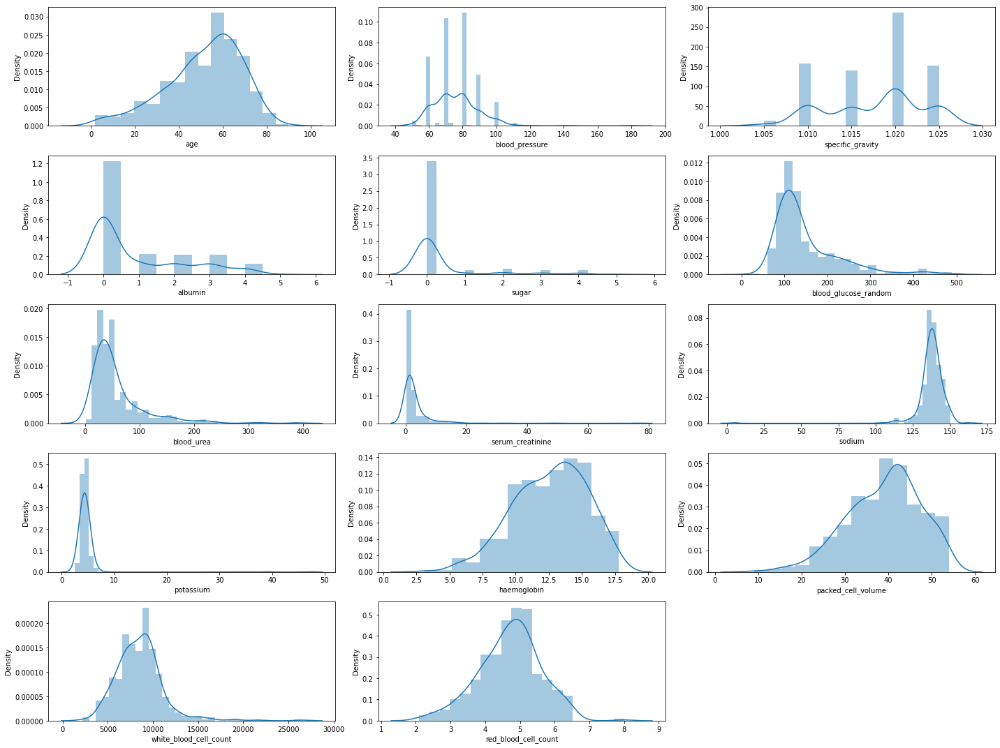

In [223]:
plt.figure(figsize=(20,15))
plotnumber=1
for column in num_col:
    if plotnumber<=14:
        ax = plt.subplot(5,3,plotnumber)
        sns.distplot(data_transformation2[column])
        plt.xlabel(column)
        
    plotnumber += 1 
plt.tight_layout()
plt.show()   


**Analysis :** Almost all numeric variables have a distribution that resembles a Gaussian distribution

###### Visualisation of categorical features compared to the target  :

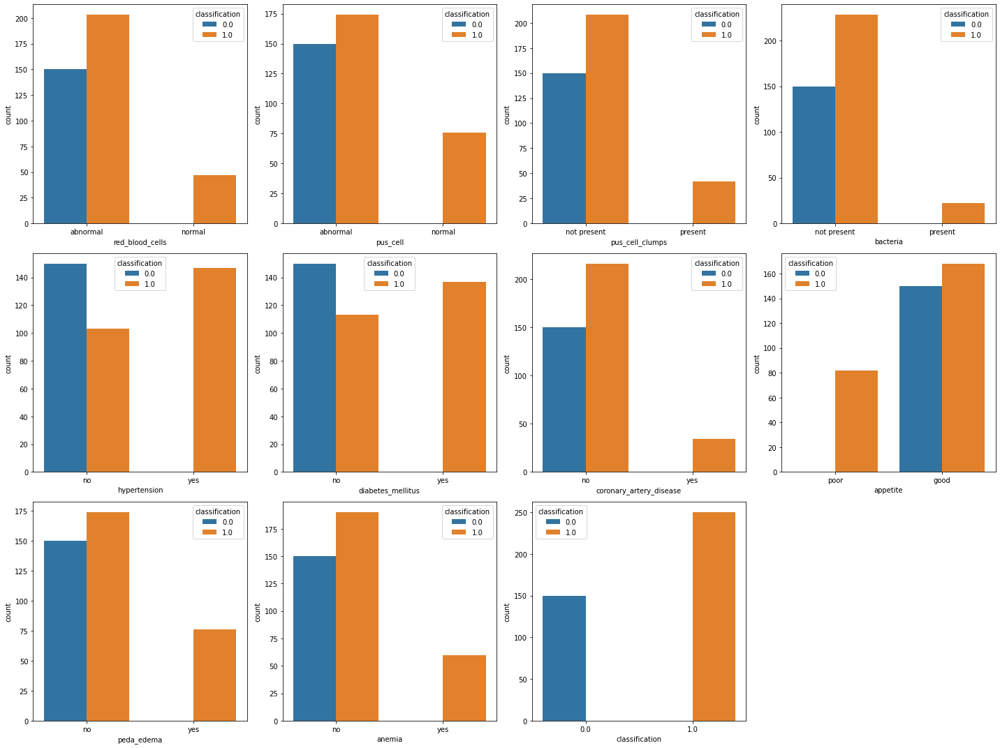

In [224]:
plt.figure(figsize = (20, 15))
plotnumber = 1

for column in cat_col:
    if plotnumber <= 11:
        ax = plt.subplot(3, 4, plotnumber)
        sns.countplot(x=column,hue='classification', data=data_transformation2)
        if (column in ['red_blood_cells', 'pus_cell']):
            x = ["abnormal", "normal"]
            default_x_ticks = [0.0, 1.0]
            plt.xticks(default_x_ticks, x)
        elif (column in ['pus_cell_clumps', 'bacteria']):
            x = ["not present", "present"]
            default_x_ticks = [0.0, 1.0]
            plt.xticks(default_x_ticks, x)
        elif (column in ['hypertension', 'diabetes_mellitus',  'peda_edema', 'coronary_artery_disease', 'anemia' ]): 
            x = ["no", "yes"]
            default_x_ticks = [0.0, 1.0]
            plt.xticks(default_x_ticks, x)
        elif (column == 'appetite'):
            x = ["poor", "good"]
            default_x_ticks = [0.0, 1.0]
            plt.xticks(default_x_ticks, x)
        plt.xlabel(column)
        
    plotnumber += 1

plt.tight_layout()
plt.show()

**Analysis :** 

   - The data is unbalanced because among 400 observations, there is a difference of 100 observations between the CKD and the notCKD
   - Most of the ill persons suffer from  : 
       - Hypertension
       - Diabetes
       - Pedal Edema
       - Abnormal red blood cells and puss cells
       - Absence of puss cell clumps
       - poor appetite
       - Anemia

##### Correlation Matrix

<AxesSubplot: >

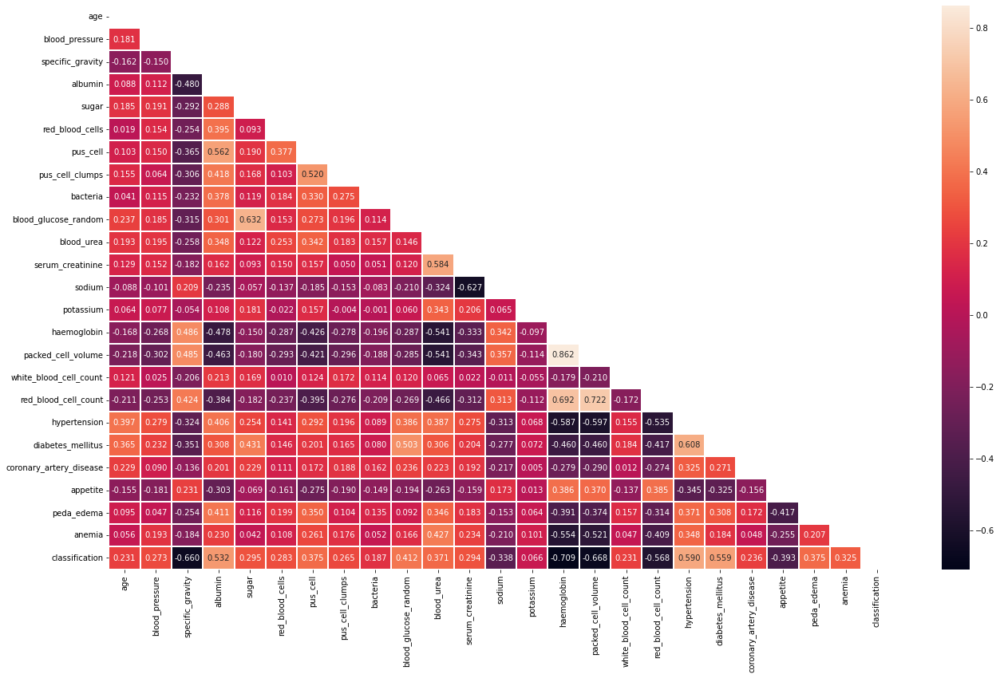

In [225]:
# Now that we have our features, let's plot them on a correlation matrix to remove anything that might 
# cause multi-colinearity within our model

mask = np.triu(np.ones_like(data_transformation2.corr(), dtype=bool))
plt.figure(figsize=(22, 13))
sns.heatmap(data_transformation2.corr(),
            mask = mask,
            fmt = '.3f',
            linewidths = 2,
            annot = True)


**Analysis :** There is a strong correlation between :
        
   - Haemoglobin and packed_cell_volume 
   - Blood Urea and Serum creatinine
The features that are the most correlated with the target are : 

   - Haemoglobin
   - packed cell volume and specific gravity 

## Modelisation

In [226]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn import metrics
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict, validation_curve
from numpy import array
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix, accuracy_score, make_scorer

from scipy.stats import pointbiserialr
from math import sqrt

from sklearn.model_selection import GridSearchCV

import copy as cp

from typing import Tuple

In [227]:
# !pip install lazypredict

from lazypredict.Supervised import LazyClassifier

In [228]:
# Copying the data
data_m=df_normalized.copy()

In [229]:
# Splitting the data into train and test 
x = data_m.iloc[:, :-1]
y = data_m.iloc[:, -1]
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.4, random_state=1)

In [230]:
# Quick measurement of the performance of classification algorithms 

model = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = model.fit(X_train, X_test, y_train, y_test)
print(predictions)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 46.75it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
RandomForestClassifier             0.99               0.99     0.99      0.99   
ExtraTreesClassifier               0.98               0.98     0.98      0.98   
SGDClassifier                      0.98               0.98     0.98      0.98   
SVC                                0.97               0.98     0.98      0.98   
BaggingClassifier                  0.97               0.98     0.98      0.98   
ExtraTreeClassifier                0.97               0.98     0.98      0.98   
AdaBoostClassifier                 0.97               0.97     0.97      0.97   
LinearSVC                          0.97               0.97     0.97      0.97   
CalibratedClassifierCV             0.97               0.97     0.97      0.97   
XGBClassifier                      0.97               0.97     0.97      0.97   
LogisticRegression          

**Analysis :** Through this report, we can see that there are many powerful algorithms, and the results are very good. Among the list of algorithms that we are going to work with, SVM should have the best accuracy according to this report

In this study, we are going to use 3 models : 
    
   - SVM : are a set of supervised learning methods used for classification, regression and outliers detection.
   - Naive Bayes Classifiers : are a collection of classification algorithms based on Bayes’ Theorem. It is not a single algorithm but a family of algorithms where all of them share a common principle, i.e. every pair of features being classified is independent of each other
   - KNN : based on feature similarity approach.

### Preparation of the K-Fold Cross validation functions

###### Confusion matrix :
In order to evaluate a model, we need to plot its confusion matrix. With K-Fold, the predefined confusion_matrix doesn't work since we don't have known train and test sets. That's why, we need to implement two functions in order to see the confusion matrix of the model trained and test with the K-Fold cross validation 

In [231]:
# Function to calculate the predicted and actual classes
def cross_val_predict(model, kfold : KFold, X : np.array, y : np.array):
#     Takes a local copy of the machine learning algorithm (model) to avoid changing the one passed in
    model_ = cp.deepcopy(model)
    
    no_classes = len(np.unique(y))
    
    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes]) 

    for train_ndx, test_ndx in kfold.split(X):
#         Extracts the rows from the data for the training features, training target, test features and test target
        train_X, train_y, test_X, test_y = X[train_ndx], y[train_ndx], X[test_ndx], y[test_ndx]
    
# Appends the actual target classifications to actual_classes
        actual_classes = np.append(actual_classes, test_y)
    
# Fits the machine learning model using the training data extracted from the current fold
        model_.fit(train_X, train_y)
    
#     Uses the fitted model to predict the target classifications for the test data in the current fold
        predicted_classes = np.append(predicted_classes, model_.predict(test_X))
    
# Appends the predicted classes for the current fold of test data to predicted_classes
        try:
            predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)
        except:
            predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

#     returns the full set of actual and predicted classes (classifications) that can be used to plot a confusion matrix.
    return actual_classes, predicted_classes, predicted_proba

In [232]:
# Function to visualize the confusion matrix
def plot_confusion_matrix(actual_classes : np.array, predicted_classes : np.array, sorted_labels : list):

    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)
    
    plt.figure(figsize=(12.8,6))
    sns.heatmap(matrix, annot=True, xticklabels=sorted_labels, yticklabels=sorted_labels, cmap="Blues", fmt="g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

######  Classification Report :
We also need to see the classification report of the model in order to anylize it. The classification report contains informations such as the accuracy, the f1-score, the precision and the recall. Just like the confusion matrix, we need a function to display the classification report

In [233]:
# Function to prepare the classification report
def classification_report_with_accuracy_score(y_true, y_pred):
    originalclass.extend(y_true)
    predictedclass.extend(y_pred)
    return accuracy_score(y_true, y_pred) # return accuracy score

In this study, we are going to work with the 10-Fold cross validation, meaning that our data is going to be split into 10 folds

In [234]:
kfold = KFold(n_splits=10, random_state=42, shuffle=True)

## Method 1 : Whithout feature selection and ensemble learning


In [235]:
# data_x = data_m.iloc[:,:-1]
# data_y = data_m.iloc[:,-1]

# # enumerate splits
# train_split = []
# test_split = []

# for train, test in kfold.split(data_m):
# #     print(train.shape)
# #     print(test.shape)
# #     print('train_x: %s, test_x: %s' % (data_x.iloc[train], data_x.iloc[test]))
# #     print('train_y: %s, test_y: %s' % (data_y.iloc[train], data_y.iloc[test]))
#     train_split.append(train)
#     test_split.append(test)

# print ("------- Naive Bayes -------")
# for train, test in kfold.split(data_m):
#     gnb = GaussianNB()
#     gnb.fit(data_x.iloc[train], data_y.iloc[train])
#     y_pred = gnb.predict(data_x.iloc[test])
#     print("Accuracy:",metrics.accuracy_score(data_y.iloc[test], y_pred))
    
# print ("------- KNN -------")
# for train, test in kfold.split(data_m):
#     knn= KNeighborsClassifier(n_neighbors=5, metric='euclidean', p=2 )  
#     knn.fit(data_x.iloc[train], data_y.iloc[train])  
#     y_pred= knn.predict(data_x.iloc[test])  
#     print("Accuracy:",metrics.accuracy_score(data_y.iloc[test], y_pred))
# print ("------- SVM -------")
# for train, test in kfold.split(data_m):
#     classifier = SVC(kernel = 'linear', random_state = 0)
#     classifier.fit(data_x.iloc[train], data_y.iloc[train])  
#     y_pred = classifier.predict(data_x.iloc[test])  
#     print("Accuracy:",metrics.accuracy_score(data_y.iloc[test], y_pred))

In [236]:
# Splitting the data into data and target
data_x = data_m.iloc[:,:-1]
data_y = data_m.iloc[:,-1]

###### Naive Bayes 

In [237]:
originalclass = []
predictedclass = []

In [238]:
nb_score1 = cross_val_score(GaussianNB(), X=data_x, y=data_y, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("Naive Bayes accuracy : ",nb_score1.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

Naive Bayes accuracy :  0.9674999999999999
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96       150
         1.0       1.00      0.95      0.97       250

    accuracy                           0.97       400
   macro avg       0.96      0.97      0.97       400
weighted avg       0.97      0.97      0.97       400



**Analysis :** We have 4 different informations that are important : 

   - The **accuracy** for the Naive Bayes model is : 0.967 
   - **Precision** : What percent of your predictions were correct ? Precision is the ability of a classifier not to label an instance positive that is actually negative.
       - Out of all the persons, that the model predicted as ill, 100% were actually ill.
   - **Recall** : What percent of the positive cases did you catch ? Recall is the ability of a classifier to find all positive instances.
       - Out of all the persons that are actually ill, the model predicted correctly 95% of those persons
   - **F1 score** : What percent of positive predictions were correct ? The F1 score is a weighted harmonic mean of precision and recall such that the best score is 1.0 and the worst is 0.0
       - The F1 score is very close to 1, we can say that this model does a good job of predicting whether or not a person is ill.

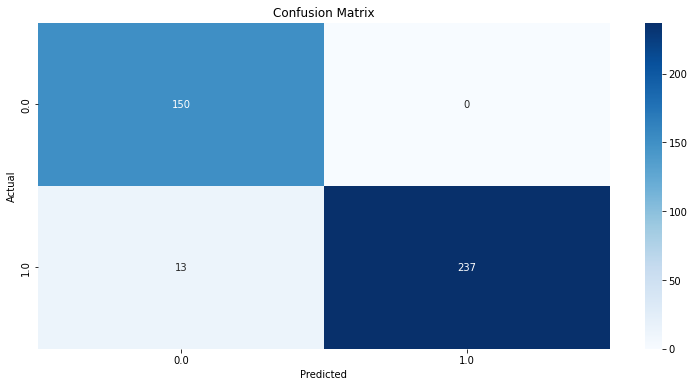

In [239]:
actual_classes, predicted_classes, _ = cross_val_predict(GaussianNB(), kfold, data_x.to_numpy(), data_y.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 237 observations were predicted ill correcty
   - **False positive** : 0 observations were predicted ill uncorrectly
   - **True Negative** : 150 observations were predicted sane correctly
   - **False Negative** : 13 observations were predicted sane uncorrectly

In [240]:
# Export my data 
data_m.to_csv("CKD_Bayes.csv")

###### SVM

In [129]:
originalclass = []
predictedclass = []

In [130]:
svm_score1 = cross_val_score(SVC(kernel= 'linear' ), X=data_x, y=data_y, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("SVM accuracy : ",svm_score1.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

SVM accuracy :  0.9625
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95       150
         1.0       0.99      0.95      0.97       250

    accuracy                           0.96       400
   macro avg       0.96      0.97      0.96       400
weighted avg       0.96      0.96      0.96       400



**Analysis :** We have 4 different informations that are important : 

   - The **accuracy** for the SVM model is : 0.9625
   - **Precision** : Out of all the persons, that the model predicted as ill, 99% were actually ill.
   - **Recall** : Out of all the persons that are actually ill, the model predicted correctly 95% of those persons
   - **F1 score** : The F1 score is very close to 1, we can say that this model does a good job of predicting whether or not a person is ill.

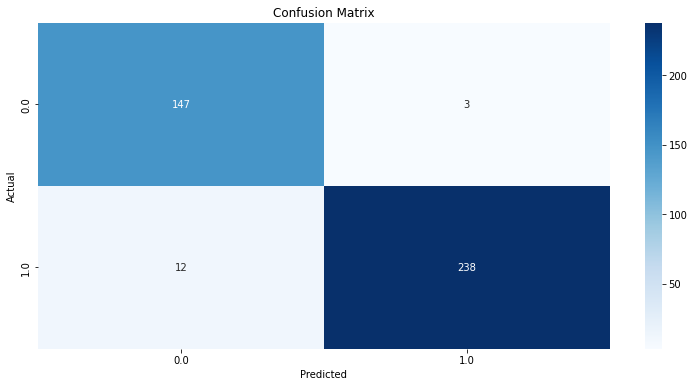

In [131]:
actual_classes, predicted_classes, _ = cross_val_predict(SVC(kernel= 'linear' ), kfold, data_x.to_numpy(), data_y.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 238 observations were predicted ill correcty
   - **False positive** : 3 observations were predicted ill uncorrectly
   - **True Negative** : 147 observations were predicted sane correctly
   - **False Negative** : 12 observations were predicted sane uncorrectly

###### KNN

In [132]:
originalclass = []
predictedclass = []

In [133]:
# k = [2, 5, 8, 10]
# for j in k:
#     print("-"*50, j , " Neighbours", "-"*50)
knn_score1 = cross_val_score((KNeighborsClassifier(n_neighbors=5, metric='euclidean')), X=data_x, y=data_y, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("KNN accuracy : ",knn_score1.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

KNN accuracy :  0.6525000000000001
              precision    recall  f1-score   support

         0.0       0.53      0.64      0.58       150
         1.0       0.75      0.66      0.70       250

    accuracy                           0.65       400
   macro avg       0.64      0.65      0.64       400
weighted avg       0.67      0.65      0.66       400



**Analysis :** We have 4 different informations that are important : 

   - The **accuracy** for the KNN model is : 0.6525
   - **Precision** : Out of all the persons, that the model predicted as ill, 75% were actually ill.
   - **Recall** : Out of all the persons that are actually ill, the model predicted correctly 66% of those persons
   - **F1 score** : The F1 score is closer to 1, we can say that this model does a decent job of predicting whether or not a person is ill.

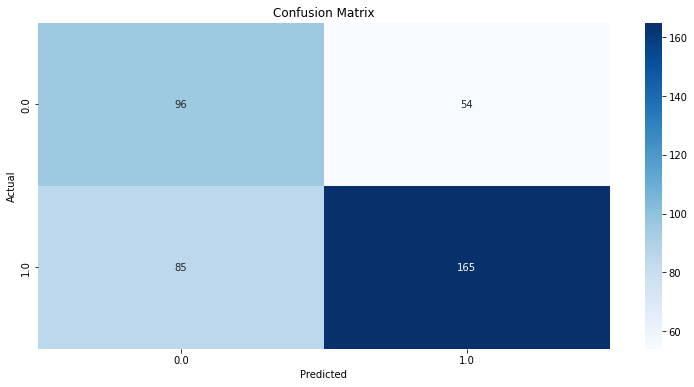

In [134]:
actual_classes, predicted_classes, _ = cross_val_predict((KNeighborsClassifier(n_neighbors=5, metric='euclidean' )), kfold, data_x.to_numpy(), data_y.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 165 observations were predicted ill correcty
   - **False positive** : 54 observations were predicted ill uncorrectly
   - **True Negative** : 96 observations were predicted sane correctly
   - **False Negative** : 85 observations were predicted sane uncorrectly

**Conclusion** : SVM and Naive Bayes are better

Let's try to use the grid search to find the best knn estimator for this data

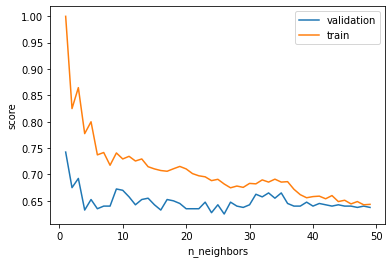

In [135]:
model = KNeighborsClassifier()
k = np.arange(1, 50)

train_score, val_score = validation_curve(model, data_x, data_y,param_name="n_neighbors", param_range=k, cv=kfold)

plt.plot(k, val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

In [136]:
param_grid = {'n_neighbors': np.arange(1, 20),
              'metric': ['euclidean', 'manhattan']}

grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=kfold)

grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])})

In [137]:
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)

0.7083333333333333
{'metric': 'manhattan', 'n_neighbors': 1}
KNeighborsClassifier(metric='manhattan', n_neighbors=1)


According to the grid search, the best estimator uses the manhattan metric and 1 neighbor. So let's try to see if this combination is better than the one we used above. 

In [138]:
originalclass = []
predictedclass = []

In [139]:
knn_score2 = cross_val_score((KNeighborsClassifier(n_neighbors=1, metric='manhattan')), X=data_x, y=data_y, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("KNN accuracy : ",knn_score2.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

KNN accuracy :  0.765
              precision    recall  f1-score   support

         0.0       0.64      0.85      0.73       150
         1.0       0.89      0.72      0.79       250

    accuracy                           0.77       400
   macro avg       0.76      0.78      0.76       400
weighted avg       0.79      0.77      0.77       400



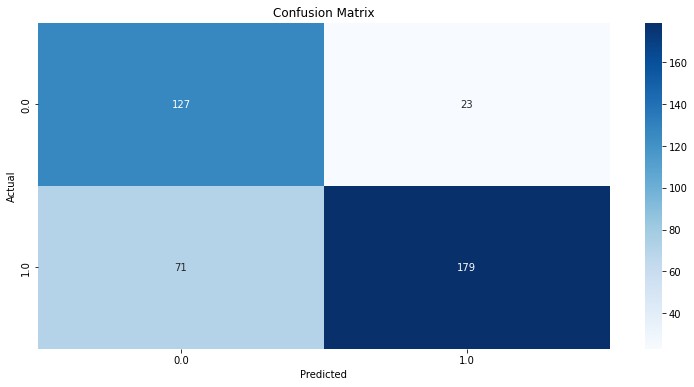

In [140]:
actual_classes, predicted_classes, _ = cross_val_predict((KNeighborsClassifier(n_neighbors=1, metric='manhattan')), kfold, data_x.to_numpy(), data_y.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Conclusion :** The results of the KNN model with the manhattan metric are actually better but the SVM and the Naive Bayes are still performing better

## Method 2 : CFS without ensemble learning

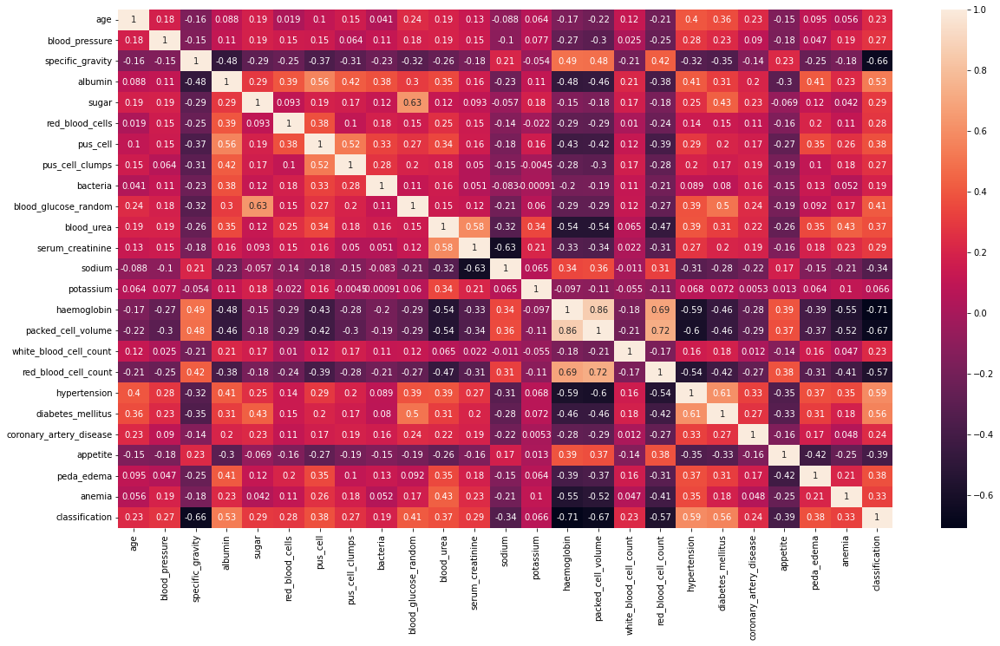

In [141]:
plt.figure(figsize=(20,11))
cor = data_m.corr()
sns.heatmap(cor,annot = True)
plt.show()

The first thing to implement is the evaluation function (merit), which gets the subset and label name as inputs.

In [142]:
def getMerit(subset, label):
    k = len(subset)

    # average feature-class correlation
    rcf_all = []
    for feature in subset:
        coeff = pointbiserialr( data_m[label], data_m[feature] )
        rcf_all.append( abs( coeff.correlation ) )
    rcf = np.mean( rcf_all )

    # average feature-feature correlation
    corr = data_m[subset].corr()
    corr.values[np.tril_indices_from(corr.values)] = np.nan
    corr = abs(corr)
    rff = corr.unstack().mean()

    return (k * rcf) / sqrt(k + k * (k-1) * rff)

**Best First Search** : the search starts with iterating through all features and searching for the feature with the highest feature-class correlation.

In [147]:
label = 'classification'

features = data_m.columns.tolist()
features.remove(label)

best_value = -1
best_feature = ''
for feature in features:
    coeff = pointbiserialr( data_m[label], data_m[feature] )
    abs_coeff = abs( coeff.correlation )
    if abs_coeff > best_value:
        best_value = abs_coeff
        best_feature = feature
print("Feature %s with merit %.4f"%(best_feature, best_value))

Feature haemoglobin with merit 0.7086


The best first feature is the one with name haemoglobin , as it has the highest feature-class correlation

In [148]:
def correlation(dataset,threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j])>threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [153]:
data_only = data_m.drop(['classification'], axis = 1)
corr_features = correlation(data_only,0.58)
len(set(corr_features))
corr_features

{'blood_glucose_random',
 'diabetes_mellitus',
 'hypertension',
 'packed_cell_volume',
 'red_blood_cell_count',
 'serum_creatinine',
 'sodium'}

The results seem logical since the haemoglobin which is the best feature with the highest feature-class correlation wasn't selected by the CFS to get dropped

In [154]:
data_only.drop(data_m[corr_features],axis = 1, inplace=True)

In [155]:
data_only.columns

Index(['age', 'blood_pressure', 'specific_gravity', 'albumin', 'sugar',
       'red_blood_cells', 'pus_cell', 'pus_cell_clumps', 'bacteria',
       'blood_urea', 'potassium', 'haemoglobin', 'white_blood_cell_count',
       'coronary_artery_disease', 'appetite', 'peda_edema', 'anemia'],
      dtype='object')

In [156]:
data_x2 = data_only
data_y2 = data_m.iloc[:,-1]

###### Naive Bayes 

In [157]:
originalclass = []
predictedclass = []

In [158]:
nb_score2 = cross_val_score(GaussianNB(), X=data_x2, y=data_y2, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("Naive Bayes accuracy : ",nb_score2.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

Naive Bayes accuracy :  0.9199999999999999
              precision    recall  f1-score   support

         0.0       0.82      1.00      0.90       150
         1.0       1.00      0.87      0.93       250

    accuracy                           0.92       400
   macro avg       0.91      0.94      0.92       400
weighted avg       0.93      0.92      0.92       400



**Analysis :** We have 4 different informations that are important : 

   - The **accuracy** for the Naive Bayes model is : 0.919 
   - **Precision** :Out of all the persons, that the model predicted as ill, 100% were actually ill.
   - **Recall** : Out of all the persons that are actually ill, the model predicted correctly 87% of those persons
   - **F1 score** : The F1 score is very close to 1, we can say that this model does a good job of predicting whether or not a person is ill.

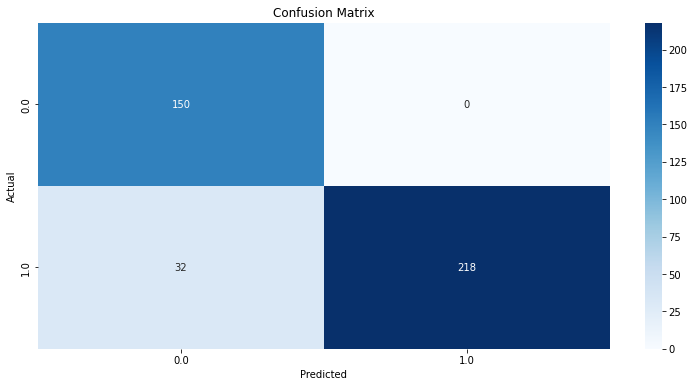

In [159]:
actual_classes, predicted_classes, _ = cross_val_predict(GaussianNB(), kfold, data_x2.to_numpy(), data_y2.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 218 observations were predicted ill correcty
   - **False positive** : 0 observations were predicted ill uncorrectly
   - **True Negative** : 150 observations were predicted sane correctly
   - **False Negative** : 32 observations were predicted sane uncorrectly
   
**Conclusion :** The Naive Bayes model performed better without the CFS feature extraction

###### SVM

In [161]:
originalclass = []
predictedclass = []

In [162]:
svm_score2 = cross_val_score(SVC(kernel= 'linear' ), X=data_x2, y=data_y2, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("SVM accuracy : ",svm_score2.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

SVM accuracy :  0.9299999999999999
              precision    recall  f1-score   support

         0.0       0.86      0.97      0.91       150
         1.0       0.98      0.91      0.94       250

    accuracy                           0.93       400
   macro avg       0.92      0.94      0.93       400
weighted avg       0.94      0.93      0.93       400



**Analysis :** We have 4 different informations that are important : 

   - The **accuracy** for the SVM model is : 0.929
   - **Precision** : Out of all the persons, that the model predicted as ill, 98% were actually ill.
   - **Recall** : Out of all the persons that are actually ill, the model predicted correctly 91% of those persons
   - **F1 score** : The F1 score is very close to 1, we can say that this model does a good job of predicting whether or not a person is ill.

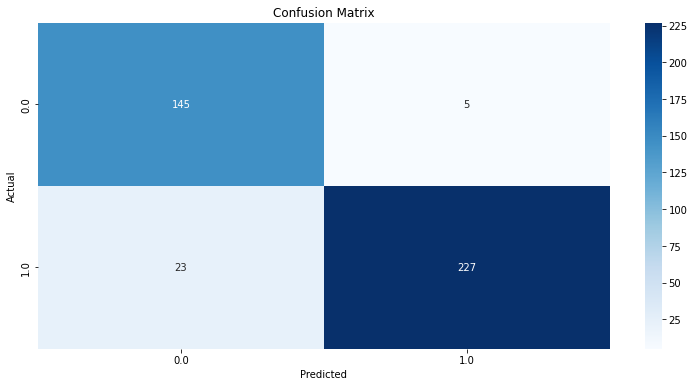

In [163]:
actual_classes, predicted_classes, _ = cross_val_predict(SVC(kernel= 'linear' ), kfold, data_x2.to_numpy(), data_y2.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 227 observations were predicted ill correcty
   - **False positive** : 5 observations were predicted ill uncorrectly
   - **True Negative** : 145 observations were predicted sane correctly
   - **False Negative** : 23 observations were predicted sane uncorrectly

###### KNN

In [164]:
originalclass = []
predictedclass = []

In [165]:
# k = [2, 5, 8, 10]
# for j in k:
#     print("-"*50, j , " Neighbours", "-"*50)
knn_score3 = cross_val_score((KNeighborsClassifier(n_neighbors=5, metric='euclidean')), X=data_x2, y=data_y2, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("KNN accuracy : ",knn_score3.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

KNN accuracy :  0.635
              precision    recall  f1-score   support

         0.0       0.51      0.61      0.55       150
         1.0       0.73      0.65      0.69       250

    accuracy                           0.64       400
   macro avg       0.62      0.63      0.62       400
weighted avg       0.65      0.64      0.64       400



**Analysis :** We have 4 different informations that are important :

   - The **accuracy** for the KNN model is : 0.635
   - **Precision** : Out of all the persons, that the model predicted as ill, 73% were actually ill.
   - **Recall** : Out of all the persons that are actually ill, the model predicted correctly 65% of those persons
   - **F1 score** : The F1 score is closer to 1, we can say that this model does a decent job of predicting whether or not a person is ill.

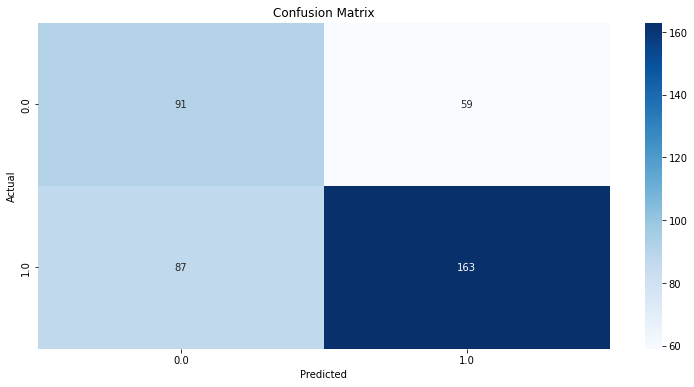

In [167]:
actual_classes, predicted_classes, _ = cross_val_predict((KNeighborsClassifier(n_neighbors=5, metric='euclidean' )), kfold, \
                                                         data_x2.to_numpy(), data_y2.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 163 observations were predicted ill correcty
   - **False positive** : 59 observations were predicted ill uncorrectly
   - **True Negative** : 91 observations were predicted sane correctly
   - **False Negative** : 87 observations were predicted sane uncorrectly

Let's try to use the grid search to find the best knn estimator for this data

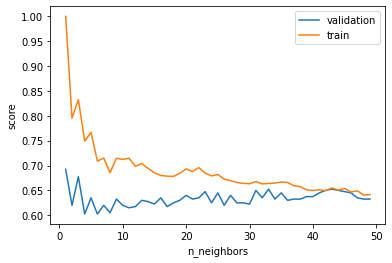

In [168]:
model = KNeighborsClassifier()
k = np.arange(1, 50)

train_score, val_score = validation_curve(model, data_x2, data_y2,param_name="n_neighbors", param_range=k, cv=kfold)

plt.plot(k, val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

In [169]:
param_grid = {'n_neighbors': np.arange(1, 20),
              'metric': ['euclidean', 'manhattan']}

grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=kfold)

grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])})

In [170]:
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)

0.7083333333333333
{'metric': 'manhattan', 'n_neighbors': 1}
KNeighborsClassifier(metric='manhattan', n_neighbors=1)


According to the grid search, the best estimator uses the manhattan metric and 1 neighbor. So let's try to see if this combination is better than the one we used above. 

In [171]:
originalclass = []
predictedclass = []

In [172]:
knn_score4 = cross_val_score((KNeighborsClassifier(n_neighbors=1, metric='manhattan')), X=data_x2, y=data_y2, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("KNN accuracy : ",knn_score4.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

KNN accuracy :  0.6900000000000001
              precision    recall  f1-score   support

         0.0       0.57      0.74      0.64       150
         1.0       0.81      0.66      0.73       250

    accuracy                           0.69       400
   macro avg       0.69      0.70      0.68       400
weighted avg       0.72      0.69      0.69       400



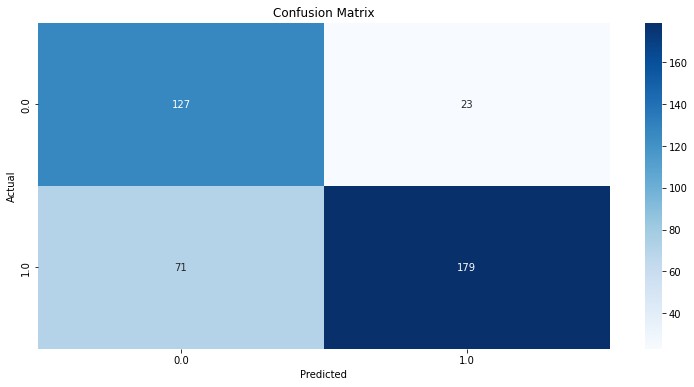

In [173]:
actual_classes, predicted_classes, _ = cross_val_predict((KNeighborsClassifier(n_neighbors=1, metric='manhattan')), kfold, data_x.to_numpy(), data_y.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Conclusion :** The results of the KNN model with the manhattan metric are slightly better but the SVM and the Naive Bayes are still performing better

## Method 3 : CFS + Adaboost

###### Naive Bayes 

In [174]:
originalclass = []
predictedclass = []

In [175]:
gnb = GaussianNB()
abc = AdaBoostClassifier(base_estimator=gnb)

nb_score3 = cross_val_score(abc, X=data_x2, y=data_y2, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("Naive Bayes accuracy : ",nb_score3.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

Naive Bayes accuracy :  0.875
              precision    recall  f1-score   support

         0.0       0.86      0.79      0.83       150
         1.0       0.88      0.92      0.90       250

    accuracy                           0.88       400
   macro avg       0.87      0.86      0.86       400
weighted avg       0.87      0.88      0.87       400



**Analysis :** We have 4 different informations that are important : 

   - The **accuracy** for the Naive Bayes model is : 0.875
   - **Precision** :Out of all the persons, that the model predicted as ill, 88% were actually ill.
   - **Recall** : Out of all the persons that are actually ill, the model predicted correctly 92% of those persons
   - **F1 score** : The F1 score is very close to 1, we can say that this model does a good job of predicting whether or not a person is ill.

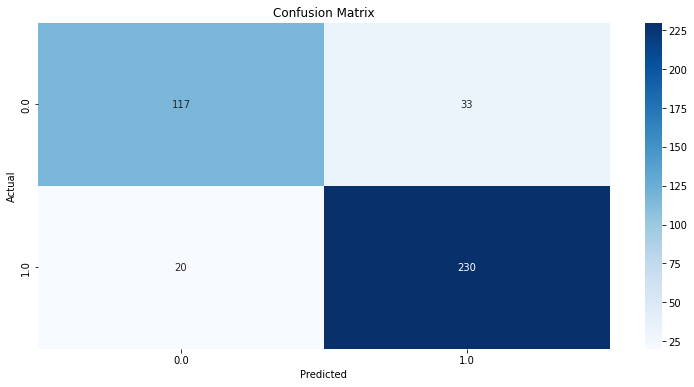

In [176]:
actual_classes, predicted_classes, _ = cross_val_predict(abc, kfold, data_x2.to_numpy(), data_y2.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 230 observations were predicted ill correcty
   - **False positive** : 33 observations were predicted ill uncorrectly
   - **True Negative** : 117 observations were predicted sane correctly
   - **False Negative** : 20 observations were predicted sane uncorrectly

###### SVM

In [177]:
originalclass = []
predictedclass = []

In [178]:
svc = SVC(kernel= 'linear' )
abc = AdaBoostClassifier(base_estimator=svc,algorithm='SAMME')

svm_score3 = cross_val_score(abc, X=data_x2, y=data_y2, cv=kfold, \
                               scoring=make_scorer(classification_report_with_accuracy_score))
print("SVM accuracy : ",svm_score3.mean())
# Average values in classification report for all folds in a K-fold Cross-validation  
print(classification_report(originalclass, predictedclass)) 

SVM accuracy :  0.9399999999999998
              precision    recall  f1-score   support

         0.0       0.89      0.95      0.92       150
         1.0       0.97      0.93      0.95       250

    accuracy                           0.94       400
   macro avg       0.93      0.94      0.94       400
weighted avg       0.94      0.94      0.94       400



**Analysis :** We have 4 different informations that are important : 

   - The **accuracy** for the SVM model is : 0.929
   - **Precision** : Out of all the persons, that the model predicted as ill, 98% were actually ill.
   - **Recall** : Out of all the persons that are actually ill, the model predicted correctly 91% of those persons
   - **F1 score** : The F1 score is very close to 1, we can say that this model does a good job of predicting whether or not a person is ill.

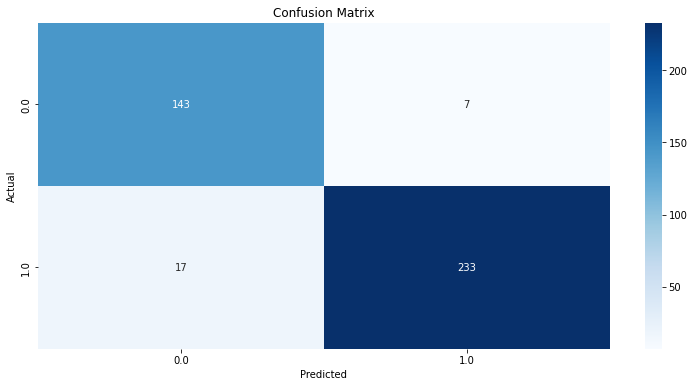

In [179]:
actual_classes, predicted_classes, _ = cross_val_predict(abc, kfold, data_x2.to_numpy(), data_y2.to_numpy())
plot_confusion_matrix(actual_classes, predicted_classes, [0.0,  1.0])


**Analysis :** We have 4 important informations 
    
   - **True positive** : 227 observations were predicted ill correcty
   - **False positive** : 5 observations were predicted ill uncorrectly
   - **True Negative** : 145 observations were predicted sane correctly
   - **False Negative** : 23 observations were predicted sane uncorrectly

###### KNN

In [180]:
originalclass = []
predictedclass = []

In [183]:
# k = [2, 5, 8, 10]
# for j in k:
#     print("-"*50, j , " Neighbours", "-"*50)
# knn = KNeighborsClassifier(n_neighbors=5, metric='euclidean')
# abc = AdaBoostClassifier(base_estimator=knn)

# knn_score4 = cross_val_score(abc, X=data_x2, y=data_y2, cv=kfold, \
#                                scoring=make_scorer(classification_report_with_accuracy_score))
# print("KNN accuracy : ",knn_score4.mean())
# # Average values in classification report for all folds in a K-fold Cross-validation  
# print(classification_report(originalclass, predictedclass)) 

**!! The KNN model is not supported by adaboost and therefore we cannot try to run the knn model in adaboost**

### Conclusion : 
The best combination to predict the illness of the person is : Naive Bayes withour feature selection and without ensemble learning

◾️ **NB :** We tried to remove the outliers but most of the models' accuracy decreased. We tried two methods : 
   
   - The first : By replacing all the outliers with the quantile method (Vmin = Q1 - 1.5(Q3_Q1) and Vmax = Q3 + 1.5(Q3_Q1))
   - The second : By changing the most extreme values -> Replacing some of the outliers values with the min or the max value

<center>
    <h3>These are the accuracy results we obtained in the diffent cases :</h3>
<table>
  <tr>
    <th> Model </th>
    <th> Without changing outliers </th> 
    <th> With changing outliers (method 1) </th> 
    <th> With changing outliers (method 2) </th> 
      <th> Best Accuracy </th>
  </tr>
  <tr>
    <td>Base + SVM</td>
    <td> 0.9625</td>
    <td> 0.95749 </td>  
    <td> 0.0.9625</td>
      <td> Without changing outliers</td>
  </tr>
  <tr>
    <td>Base + Naive Bayes</td> 
    <td>0.967 </td>
    <td>0.9675</td> 
    <td>0.9675</td> 
    <td> All equal</td>
  </tr>
  <tr>
    <td>Base + KNN</td>
    <td> 0.6525</td>
    <td>0.66749</td>  
    <td>0.66</td>
    <td> With changing outliers (method 1)</td>
  </tr>
  <tr>
    <td>SVM + CFS</td>
    <td> 0.929</td>
    <td> 0.8525</td>  
    <td>0.8825</td>
    <td> Without changing outliers</td>
  </tr>
  <tr>
    <td>NB + CFS</td>
    <td>0.919</td>
    <td>0.9175</td>  
    <td>0.9175</td>
    <td> Without changing outliers</td>
  </tr>
  
  <tr>
    <td> KNN + CFS</td>
    <td> 0.635</td>
    <td>0.6526</td>  
    <td>0.65</td>
    <td> Without changing outliers</td>
  </tr>
  <tr>
    <td>Adaboost + CFS + SVM</td> 
    <td>0.93 </td>
    <td>0.855</td>  
    <td>0.8625</td>
    <td> Without changing outliers</td>
  </tr>
    <tr>
    <td>Adaboost + CFS + NB</td>
     <td> 0.875</td>
     <td>0.8625</td>  
     <td>0.865</td>
     <td> Without changing outliers</td>
    </tr>

</table>
</center>

In [184]:
from pandas_profiling import ProfileReport
report = ProfileReport(df)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

This report summarizes almost everything we said in the data exploration part